### Imports

In [2]:
import os
import tensorflow as tf

In [3]:
tf.keras.backend.clear_session()

In [5]:
from tfx.orchestration.experimental.interactive.interactive_context import InteractiveContext

In [6]:
context=InteractiveContext()

# Data Ingestion

In [7]:
DATA_DIR=os.path.join(os.getcwd(),"data")

In [8]:
from tfx.components import ImportExampleGen
from tfx.proto import example_gen_pb2


In [9]:
tfrecord_path=os.path.join(DATA_DIR,"tfrecords")

## Data Splitting

In [10]:
output_config=example_gen_pb2.Output(
    split_config=example_gen_pb2.SplitConfig(
        splits=[
            example_gen_pb2.SplitConfig.Split(
                name='train',
                hash_buckets=6
            ),
            example_gen_pb2.SplitConfig.Split(
                name='eval',
                hash_buckets=2
            ),
            example_gen_pb2.SplitConfig.Split(
                name='test',
                hash_buckets=2
            )
        ]
    )
)

In [11]:
example_gen=ImportExampleGen(
    input_base=tfrecord_path,
    output_config=output_config
)

In [13]:
context.run(example_gen)

ExecutionResult(
    component_id: ImportExampleGen
    execution_id: 2
    outputs:
        examples: OutputChannel(artifact_type=Examples, producer_component_id=ImportExampleGen, output_key=examples, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

# Feature Engineering [Custom Component]

## ComponentSpec

In [14]:
from tfx.types.component_spec import ComponentSpec
from tfx.types.component_spec import ChannelParameter
from tfx.types.component_spec import ExecutionParameter
from tfx.types.standard_artifacts import Examples


In [15]:
class FeatureEngineeringComponentSpec(ComponentSpec):
    """
    Componet Spec for custom Feature Engineering Componenet
    """

    INPUTS={
        "examples":ChannelParameter(type=Examples)
    }

    OUTPUTS={
        "feature_engineered_examples":ChannelParameter(type=Examples)
    }

    PARAMETERS={}

## Executor

In [16]:
from tfx.components.base.base_executor import BaseExecutor
from tfx.types import Artifact

In [17]:
from typing_extensions import Text,Dict,List,Any

In [18]:
import re
import tensorflow as tf
import pandas as pd
import string
from spellchecker import SpellChecker

In [19]:
class FeatureEngineeringExecutor(BaseExecutor):
    """
    Executor for custom Feature Engineering Component
    """

    def convert_tfrecord_to_dataframe(self, tfrecord_file: str):
        feature_description = {
            "text": tf.io.FixedLenFeature([], tf.string),
            "label": tf.io.FixedLenFeature([], tf.string)
        }

        def parse_example(example_proto):
            result = tf.io.parse_single_example(
                example_proto,
                feature_description
            )

            return result

        dataset = tf.data.TFRecordDataset(
            tfrecord_file,
            compression_type="GZIP"
        )
        dataset = dataset.map(parse_example)

        rows = []

        for item in dataset:
            row = {
                "text": item["text"].numpy().decode(),
                "label": item["label"].numpy().decode()
            }

            rows.append(row)

        dataframe = pd.DataFrame(rows)

        return dataframe

    def generate_features(
            self,
            data: pd.DataFrame
    ):
        """
        Generate the features from the 'text' field of data.
        The functions to generate various features are:

          - num_single_quote_error: Counts the number of single quote error in text.

          - num_spacing_error: Counts the number of extra spaces between two words.

          - num_space_absence_after_sentence_completion: Counts the number of instances where there is no
            space after sentence completion.

          - num_capitalized_words: Counts the number of capitalized word in text.

          - num_capitalization_absence_after_sentence_completion: Counts the number of instances where the
            first letter of the word after the sentence completion is not capitalized.

          - num_spelling_errors: Counts the number of mispelled words in the text.

          - num_words: Counts the number of words in text.

          - num_punctuations: Counts the number of punctuation marks in the text.

          - num_numeric_values: counts the number of numeric value in text.


        """

        def num_single_quote_error(text: str):
            num_errors = 0
            words = text.split(" ")

            ind1 = 0
            while ind1 < len(words) - 1:
                ind2 = ind1 + 1

                word1 = words[ind1]
                word2 = words[ind2]

                if word1.isalpha() and word2.isalpha():
                    word1 = word1.lower()
                    word2 = word2.lower()

                    if len(word1) > 1 and len(word2) == 1:
                        if word2 not in ['a', 'i']:
                            num_errors += 1

                    elif word1 == 'i' and (word2 == "ll" or word2 == "d"):
                        num_errors += 1

                ind1 += 1

            return num_errors

        def num_spacing_error(text: str):
            words = text.split(" ")
            num_errors = words.count("")

            return num_errors

        def num_space_absence_after_sentence_completion(text: str):
            num_errors = 0
            words = text.split(" ")

            for word in words:
                if any(punct in word for punct in ['.', '?', '!']):
                    if word[-1] not in ['.', '?', '!']:
                        num_errors += 1

            return num_errors

        def num_capitalized_words(text: str):
            num_cap_words = 0
            words = text.split(" ")

            table = str.maketrans('', '', string.punctuation)

            for word in words:
                word = word.translate(table)
                if word.isalpha():
                    if word.isupper():
                        if word != "I":
                            num_cap_words += 1

            return num_cap_words

        def num_capitalization_absence_after_sentence_completion(text: str):
            num_errors = 0
            punct_to_check_for = ['.', '?', '!']

            for punct in punct_to_check_for:
                sent = text.split(punct)
                sent = [s.strip() for s in sent if s != '']

                for s in sent:
                    if s != '':
                        first_letter = s[0]
                        if first_letter.isalpha():
                            if not first_letter.isupper():
                                num_errors += 1

            return num_errors

        spell = SpellChecker()

        def num_spelling_errors(text: str):
            num_errors = 0
            table = str.maketrans('', '', string.punctuation)

            words = text.split(" ")
            for word in words:
                word = word.translate(table)
                if word.isalpha():
                    word = word.lower()
                    if word not in spell:
                        num_errors += 1

            return num_errors

        def num_words(text: str):
            words = text.split(" ")
            num = len(words) - words.count("")
            return num

        punct = list(string.punctuation)

        def num_punctuations(text: str):
            num = 0
            words = text.split(" ")

            for word in words:
                if any(p in word for p in punct):
                    num += 1

            return num

        numeric_values = list("0123456789")

        def num_numeric_values(text: str):
            num = 0
            words = text.split(" ")

            for word in words:
                if any(n in word for n in numeric_values):
                    num += 1

            return num

        data["num_single_quote_error"] = data["text"].map(
            lambda text: num_single_quote_error(text=text)
        )

        data["num_spacing_error"] = data["text"].map(
            lambda text: num_spacing_error(text=text)

        )

        data["num_space_absence_after_sentence_completion"] = data["text"].map(
            lambda text: num_space_absence_after_sentence_completion(text=text)
        )

        data["num_capitalized_words"] = data["text"].map(
            lambda text: num_capitalized_words(text=text)
        )

        data["num_capitalization_absence_after_sentence_completion"] = data["text"].map(
            lambda text: num_capitalization_absence_after_sentence_completion(text=text)
        )

        data["num_spelling_errors"] = data["text"].map(
            lambda text: num_spelling_errors(text=text)

        )

        data["num_words"] = data["text"].map(
            lambda text: num_words(text=text)
        )

        data["num_punctuations"] = data["text"].map(
            lambda text: num_punctuations(text=text)
        )

        data["num_numeric_values"] = data["text"].map(
            lambda text: num_numeric_values(text=text)
        )

        data["text"] = data["text"].map(
            lambda text: text.strip()
        )

        data["label"] = data["label"].map(
            lambda v: 0 if v == "fake" else 1)
        

        return data

    def dataframe_to_tfrecord(self, data: pd.DataFrame, tfrecord_dir: str):

        def _bytes_feature(value):
            feat = tf.train.Feature(
                bytes_list=tf.train.BytesList(value=[value])
            )

            return feat

        def _int64_feature(value):
            feat = tf.train.Feature(
                int64_list=tf.train.Int64List(value=[value])
            )

            return feat

        tfrecord_path = os.path.join(tfrecord_dir, "tf_record.gz")

        tf_record_option = tf.io.TFRecordOptions(compression_type="GZIP")
        writer = tf.io.TFRecordWriter(
            tfrecord_path,
            options=tf_record_option
        )

        for _, row in data.iterrows():
            feature = {
                "num_single_quote_error": _int64_feature(value=row["num_single_quote_error"]),
                "num_spacing_error": _int64_feature(value=row["num_spacing_error"]),
                "num_space_absence_after_sentence_completion": _int64_feature(
                    value=row["num_space_absence_after_sentence_completion"]),
                "num_capitalized_words": _int64_feature(value=row["num_capitalized_words"]),
                "num_capitalization_absence_after_sentence_completion": _int64_feature(
                    value=row["num_capitalization_absence_after_sentence_completion"]),
                "num_spelling_errors": _int64_feature(value=row["num_spelling_errors"]),
                "num_punctuations": _int64_feature(value=row["num_punctuations"]),
                "num_numeric_values": _int64_feature(value=row["num_numeric_values"]),
                "num_words":_int64_feature(value=row["num_words"]),
                "label": _int64_feature(value=row["label"])

            }

            if row["text"] != '':
                feature["text"] = _bytes_feature(value=row["text"].encode("utf-8"))


            example = tf.train.Example(
                features=tf.train.Features(feature=feature)
            )

            writer.write(example.SerializeToString())

        writer.close()

    def Do(
            self,
            input_dict: Dict[Text, List[Artifact]],
            output_dict: Dict[Text, List[Artifact]],
            exec_properties: Dict[Text, Any]
    ):
        self._log_startup(input_dict, output_dict, exec_properties)

        inp_train_tfrecord_dir = artifact_utils.get_split_uri(input_dict["examples"], "train")
        inp_val_tfrecord_dir = artifact_utils.get_split_uri(input_dict["examples"], "eval")
        inp_test_tfrecord_dir = artifact_utils.get_split_uri(input_dict["examples"], "test")

        output_artifact = output_dict["feature_engineered_examples"][-1]
        output_artifact.split_names = artifact_utils.encode_split_names(["train", "eval", "test"])

        out_train_tfrecord_dir = artifact_utils.get_split_uri(output_dict["feature_engineered_examples"], "train")
        out_val_tfrecord_dir = artifact_utils.get_split_uri(output_dict["feature_engineered_examples"], "eval")
        out_test_tfrecord_dir = artifact_utils.get_split_uri(output_dict["feature_engineered_examples"], "test")

        input_data_dirs = [inp_train_tfrecord_dir, inp_val_tfrecord_dir, inp_test_tfrecord_dir]
        output_data_dirs = [out_train_tfrecord_dir, out_val_tfrecord_dir, out_test_tfrecord_dir]

        for (inp_data_dir, out_data_dir) in zip(input_data_dirs, output_data_dirs):
            inp_tfrecord_path = os.path.join(inp_data_dir, os.listdir(inp_data_dir)[-1])

            dataset = self.convert_tfrecord_to_dataframe(tfrecord_file=inp_tfrecord_path)
            feature_dataset = self.generate_features(data=dataset)

            tf.io.gfile.makedirs(out_data_dir)

            self.dataframe_to_tfrecord(data=feature_dataset, tfrecord_dir=out_data_dir)





## Custom Component

In [20]:
from tfx.components.base.base_component import BaseComponent

In [21]:
from tfx.components.base.executor_spec import ExecutorClassSpec

In [22]:
from tfx.types import channel_utils

In [23]:
from tfx.types.standard_artifacts import Examples

In [24]:
from tfx.types import artifact_utils

In [25]:
class FeatureEngineeringComponent(BaseComponent):
    SPEC_CLASS=FeatureEngineeringComponentSpec
    EXECUTOR_SPEC=ExecutorClassSpec(FeatureEngineeringExecutor)

    def __init__(self,examples,feature_engineered_examples=None):
        if not feature_engineered_examples:
            artifact=Examples()
            artifact.split_names=artifact_utils.encode_split_names(["train","eval","test"])

            feature_engineered_examples=channel_utils.as_channel([artifact])

        spec=FeatureEngineeringComponentSpec(
            examples=examples,
            feature_engineered_examples=feature_engineered_examples
            
        )

        super(FeatureEngineeringComponent,self).__init__(spec=spec)

            

## Using Custom Component

In [26]:
feature_gen=FeatureEngineeringComponent(examples=example_gen.outputs["examples"])

In [27]:
context.run(feature_gen)

E0000 00:00:1782508767.767783 2205008 cuda_platform.cc:52] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
I0000 00:00:1782508767.837846 2206095 tf_record_dataset_op.cc:390] TFRecordDataset `buffer_size` is unspecified, default to 262144


ExecutionResult(
    component_id: FeatureEngineeringComponent
    execution_id: 3
    outputs:
        feature_engineered_examples: OutputChannel(artifact_type=Examples, producer_component_id=FeatureEngineeringComponent, output_key=feature_engineered_examples, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

# Data Validation

## Statistics Generation

In [28]:
from tfx.components import StatisticsGen

In [29]:
stat_gen=StatisticsGen(
    examples=feature_gen.outputs["feature_engineered_examples"]
)

In [30]:
context.run(stat_gen)

ExecutionResult(
    component_id: StatisticsGen
    execution_id: 4
    outputs:
        statistics: OutputChannel(artifact_type=ExampleStatistics, producer_component_id=StatisticsGen, output_key=statistics, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

In [106]:
context.show(stat_gen.outputs["statistics"])

## Schema Generation

In [32]:
from tfx.components import SchemaGen

In [33]:
schema_gen=SchemaGen(
    statistics=stat_gen.outputs["statistics"]
)

In [34]:
context.run(schema_gen)

ExecutionResult(
    component_id: SchemaGen
    execution_id: 5
    outputs:
        schema: OutputChannel(artifact_type=Schema, producer_component_id=SchemaGen, output_key=schema, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

In [35]:
context.show(schema_gen.outputs["schema"])

,Type,Presence,Valency,Domain
Feature name,,,,
'label',INT,required,,-
'num_capitalization_absence_after_sentence_completion',INT,required,,-
'num_capitalized_words',INT,required,,-
'num_numeric_values',INT,required,,-
'num_punctuations',INT,required,,-
'num_single_quote_error',INT,required,,-
'num_space_absence_after_sentence_completion',INT,required,,-
'num_spacing_error',INT,required,,-
'num_spelling_errors',INT,required,,-


## Schema Updater [Custom Component]

### ComponentSpec

In [36]:
from tfx.types import ComponentSpec
from tfx.types.component_spec import ChannelParameter
from tfx.types.component_spec import ExecutionParameter
from tfx.types import standard_artifacts
from tfx.types.standard_artifacts import Schema

In [37]:
from typing_extensions import List,Tuple

In [38]:
class SchemaUpdaterComponentSpec(ComponentSpec):
    """
    ComponentSpec for custom Schema Updater Component
    """

    INPUTS={
        "schema":ChannelParameter(type=standard_artifacts.Schema)
    }

    OUTPUTS={
        "updated_schema":ChannelParameter(type=standard_artifacts.Schema)
    }

    PARAMETERS={
        "updating_params":ExecutionParameter(type=List[Tuple[str,float]])
    }

### Executor

In [39]:
from tfx.components.base.base_executor import BaseExecutor
from tfx.types.standard_artifacts import Artifact

In [40]:
from typing_extensions import Text,Dict,List,Any

In [41]:
class SchemaUpdaterExecutor(BaseExecutor):
    """
    Custom Executor for Schema Updater
    """

    def Do(
        self,
        input_dict: Dict[Text,List[Artifact]],
        output_dict: Dict[Text,List[Artifact]],
        exec_properties: Dict[Text,Any]
    ):
        self._log_startup(input_dict,output_dict,exec_properties)
        
        schema_dir=input_dict["schema"][-1].uri
        schema_location=os.path.join(schema_dir,os.listdir(schema_dir)[-1])

        schema=tfdv.load_schema_text(schema_location)

        updating_params=exec_properties["updating_params"]

        for (feat,param_value) in updating_params:
            feature=tfdv.get_feature(schema,feat)
            feature.presence.min_fraction=param_value
            

        output_dir=output_dict["updated_schema"][-1].uri
        tf.io.gfile.makedirs(output_dir)

        tfdv.write_schema_text(
            schema,
            os.path.join(output_dir,"schema.pbtxt")
        )

        

### Custom Component

In [42]:
from tfx.components.base.base_component import BaseComponent
from tfx.components.base.executor_spec import ExecutorClassSpec
from tfx.types import channel_utils
import tensorflow_data_validation as tfdv

In [43]:
class SchemaUpdaterComponent(BaseComponent):
    """
    The Custom Component of Schema Updater
    """

    SPEC_CLASS=SchemaUpdaterComponentSpec
    EXECUTOR_SPEC=ExecutorClassSpec(SchemaUpdaterExecutor)

    def __init__(self,schema,updating_params,updated_schema=None):
        
        if not updated_schema:
            artifact=Schema()

            updated_schema=channel_utils.as_channel([artifact])


        spec=SchemaUpdaterComponentSpec(
            schema=schema,
            updated_schema=updated_schema,
            updating_params=updating_params
        )

        super(SchemaUpdaterComponent,self).__init__(spec=spec)
            
            

### Using Custom Component

In [44]:
updating_params = [
    ("text", 0.75)

]

In [45]:
schema_updater=SchemaUpdaterComponent(
    schema=schema_gen.outputs["schema"],
    updating_params=updating_params
    
)

In [46]:
context.run(schema_updater)

ExecutionResult(
    component_id: SchemaUpdaterComponent
    execution_id: 6
    outputs:
        updated_schema: OutputChannel(artifact_type=Schema, producer_component_id=SchemaUpdaterComponent, output_key=updated_schema, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

In [47]:
context.show(schema_updater.outputs["updated_schema"])

,Type,Presence,Valency,Domain
Feature name,,,,
'label',INT,required,,-
'num_capitalization_absence_after_sentence_completion',INT,required,,-
'num_capitalized_words',INT,required,,-
'num_numeric_values',INT,required,,-
'num_punctuations',INT,required,,-
'num_single_quote_error',INT,required,,-
'num_space_absence_after_sentence_completion',INT,required,,-
'num_spacing_error',INT,required,,-
'num_spelling_errors',INT,required,,-


In [48]:
schema_updater.outputs["updated_schema"].get()[0].uri

'/tmp/tfx-interactive-2026-06-27T02_48_14.657407-dzbi0bna/SchemaUpdaterComponent/updated_schema/6'

## Example Validator

In [49]:
from tfx.components import ExampleValidator

In [50]:
example_validator=ExampleValidator(
    statistics=stat_gen.outputs["statistics"],
    schema=schema_updater.outputs["updated_schema"]
)

In [51]:
context.run(example_validator)

ExecutionResult(
    component_id: ExampleValidator
    execution_id: 7
    outputs:
        anomalies: OutputChannel(artifact_type=ExampleAnomalies, producer_component_id=ExampleValidator, output_key=anomalies, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

In [52]:
context.show(example_validator.outputs["anomalies"])

# Data Preprocessing

## Data Cleaner [Custom Component]

### ComponentSpec

In [53]:
from tfx.types.component_spec import ComponentSpec
from tfx.types.component_spec import ChannelParameter
from tfx.types.component_spec import ExecutionParameter
from tfx.types.standard_artifacts import Examples

In [54]:
class DataCleanerComponentSpec(ComponentSpec):
    """
    Component Spec for Data Cleaning.
    """

    INPUTS = {
        "feature_engineered_examples": ChannelParameter(type=Examples)
    }

    OUTPUTS = {
        "preprocessed_examples": ChannelParameter(type=Examples)
    }

    PARAMETERS = {}

### Executor

In [55]:
from tfx.components.base.base_executor import BaseExecutor
from tfx.types.standard_artifacts import Artifact
from tfx.types import artifact_utils

In [56]:
from typing_extensions import Text,Dict,List,Any

In [57]:
import pandas as pd
import json

In [58]:
class DataCleanerExecutor(BaseExecutor):
    """
    Executor for custom Data Cleaner Component
    """
    
    def convert_tfrecord_to_datframe(self, tfrecord_dir: str):
        feature_description = {
            "num_single_quote_error": tf.io.FixedLenFeature([], tf.int64),
            "num_spacing_error": tf.io.FixedLenFeature([], tf.int64),
            "num_space_absence_after_sentence_completion": tf.io.FixedLenFeature([], tf.int64),
            "num_capitalized_words": tf.io.FixedLenFeature([], tf.int64),
            "num_capitalization_absence_after_sentence_completion": tf.io.FixedLenFeature([], tf.int64),
            "num_spelling_errors": tf.io.FixedLenFeature([], tf.int64),
            "num_punctuations": tf.io.FixedLenFeature([], tf.int64),
            "num_numeric_values": tf.io.FixedLenFeature([], tf.int64),
            "text": tf.io.FixedLenFeature([], tf.string, default_value=''),
            "num_words": tf.io.FixedLenFeature([], tf.int64, default_value=0),
            "label": tf.io.FixedLenFeature([], tf.int64)
        }
        

        def parse_example(example_proto):
            result = tf.io.parse_single_example(
                example_proto,
                feature_description
            )

            return result

        tf_record_file = os.path.join(tfrecord_dir, os.listdir(tfrecord_dir)[0])

        tfrecord_dataset = tf.data.TFRecordDataset(
            tf_record_file,
            compression_type="GZIP"
        )

        tfrecord_dataset = tfrecord_dataset.map(parse_example)

        rows = []

        for item in tfrecord_dataset:
            row = {
                "num_single_quote_error": item["num_single_quote_error"].numpy(),
                "num_spacing_error": item["num_spacing_error"].numpy(),
                "num_space_absence_after_sentence_completion": item[
                    "num_space_absence_after_sentence_completion"].numpy(),
                "num_capitalized_words": item["num_capitalized_words"].numpy(),
                "num_capitalization_absence_after_sentence_completion": item[
                    "num_capitalization_absence_after_sentence_completion"].numpy(),
                "num_spelling_errors": item["num_spelling_errors"].numpy(),
                "num_punctuations": item["num_punctuations"].numpy(),
                "num_numeric_values": item["num_numeric_values"].numpy(),
                "text": item["text"].numpy().decode(),
                "num_words": item["num_words"].numpy(),
                "label": item["label"].numpy()
            }

            rows.append(row)

        dataset = pd.DataFrame(rows)

        return dataset
        
    
    def remove_null_values_from_dataset(self, dataset: pd.DataFrame):
        dataset["text"] = dataset["text"].map(lambda text: text if text != '' else None)

        dataset = dataset.dropna(inplace=False)

        return dataset

    def dataframe_to_tfrecord(self, data: pd.DataFrame, tfrecord_dir: str):

        def _bytes_feature(value):
            feat = tf.train.Feature(
                bytes_list=tf.train.BytesList(value=[value])
            )

            return feat

        def _int64_feature(value):
            feat = tf.train.Feature(
                int64_list=tf.train.Int64List(value=[value])
            )

            return feat

        tfrecord_path = os.path.join(tfrecord_dir, "tf_record.gz")

        tf_record_option = tf.io.TFRecordOptions(compression_type="GZIP")
        writer = tf.io.TFRecordWriter(
            tfrecord_path,
            options=tf_record_option
        )

        for _, row in data.iterrows():
            feature = {
                "num_single_quote_error": _int64_feature(value=row["num_single_quote_error"]),
                "num_spacing_error": _int64_feature(value=row["num_spacing_error"]),
                "num_space_absence_after_sentence_completion": _int64_feature(
                    value=row["num_space_absence_after_sentence_completion"]),
                "num_capitalized_words": _int64_feature(value=row["num_capitalized_words"]),
                "num_capitalization_absence_after_sentence_completion": _int64_feature(
                    value=row["num_capitalization_absence_after_sentence_completion"]),
                "num_spelling_errors": _int64_feature(value=row["num_spelling_errors"]),
                "num_punctuations": _int64_feature(value=row["num_punctuations"]),
                "num_numeric_values": _int64_feature(value=row["num_numeric_values"]),
                "label": _int64_feature(value=row["label"])

            }

            if row["text"] != '':
                feature["text"] = _bytes_feature(value=row["text"].encode("utf-8"))

            if row["num_words"] != 0:
                feature["num_words"] = _int64_feature(value=row["num_words"])

            example = tf.train.Example(
                features=tf.train.Features(feature=feature)
            )

            writer.write(example.SerializeToString())

        writer.close()

    def Do(
            self,
            input_dict: Dict[Text, List[Artifact]],
            output_dict: Dict[Text, List[Artifact]],
            exec_properties: Dict[Text, Any]
    ):
        self._log_startup(input_dict, output_dict, exec_properties)

        inp_train_dir = artifact_utils.get_split_uri(input_dict["feature_engineered_examples"], "train")
        inp_val_dir = artifact_utils.get_split_uri(input_dict["feature_engineered_examples"], "eval")
        inp_test_dir = artifact_utils.get_split_uri(input_dict["feature_engineered_examples"], "test")

        output_artifact = output_dict["preprocessed_examples"][-1]
        output_artifact.split_names = artifact_utils.encode_split_names(["train", "eval", "test"])

        out_train_dir = artifact_utils.get_split_uri(output_dict["preprocessed_examples"], "train")
        out_val_dir = artifact_utils.get_split_uri(output_dict["preprocessed_examples"], "eval")
        out_test_dir = artifact_utils.get_split_uri(output_dict["preprocessed_examples"], "test")

        input_dirs = [inp_train_dir, inp_val_dir, inp_test_dir]
        output_dirs = [out_train_dir, out_val_dir, out_test_dir]
        
        number_of_examples={}

        for (inp_dir, out_dir) in zip(input_dirs, output_dirs):
            dataset = self.convert_tfrecord_to_datframe(tfrecord_dir=inp_dir)
            dataset = self.remove_null_values_from_dataset(dataset=dataset)
            
            split_name=inp_dir.split("/")[-1]
            number_of_examples[f"number_of_examples_in_{split_name}_data"]=len(dataset)

            tf.io.gfile.makedirs(out_dir)
            self.dataframe_to_tfrecord(data=dataset, tfrecord_dir=out_dir)
        
        
        with open("configs/model_configs/number_of_examples.json","w") as file:
            json.dump(number_of_examples,file)
        
        print("[INFO] Number of examples in each split logged")







### Custom Component

In [59]:
from tfx.components.base.base_component import BaseComponent
from tfx.components.base.executor_spec import ExecutorClassSpec
from tfx.types import channel_utils
from tfx.types import artifact_utils
from tfx.types.standard_artifacts import Examples

In [60]:
class DataCleaner(BaseComponent):
    """
    Custom Component of Data Cleaner
    """

    SPEC_CLASS = DataCleanerComponentSpec
    EXECUTOR_SPEC = ExecutorClassSpec(DataCleanerExecutor)

    def __init__(self, feature_engineered_examples, preprocessed_examples=None):
        if not preprocessed_examples:
            artifact = Examples()
            artifact.split_names = artifact_utils.encode_split_names(["train", "eval", "test"])

            preprocessed_examples = channel_utils.as_channel([artifact])

        spec = DataCleanerComponentSpec(
            feature_engineered_examples=feature_engineered_examples,
            preprocessed_examples=preprocessed_examples
        )

        super(DataCleaner, self).__init__(spec=spec)


### Using Custom Component

In [61]:
data_cleaner=DataCleaner(
    feature_engineered_examples=feature_gen.outputs["feature_engineered_examples"]
)

In [62]:
context.run(data_cleaner)

[INFO] Number of examples in each split logged


ExecutionResult(
    component_id: DataCleaner
    execution_id: 8
    outputs:
        preprocessed_examples: OutputChannel(artifact_type=Examples, producer_component_id=DataCleaner, output_key=preprocessed_examples, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

# Data Transformation

In [63]:
from tfx.components import Transform

In [64]:
transform_gen=Transform(
    examples=data_cleaner.outputs["preprocessed_examples"],
    schema=schema_updater.outputs["updated_schema"],
    module_file=os.path.abspath("modules/preprocessing_module.py")
)

In [66]:
context.run(transform_gen)

ExecutionResult(
    component_id: Transform
    execution_id: 10
    outputs:
        transform_graph: OutputChannel(artifact_type=TransformGraph, producer_component_id=Transform, output_key=transform_graph, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        transformed_examples: OutputChannel(artifact_type=Examples, producer_component_id=Transform, output_key=transformed_examples, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        updated_analyzer_cache: OutputChannel(artifact_type=TransformCache, producer_component_id=Transform, output_key=updated_analyzer_cache, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        pre_transform_schema: OutputChannel(artifact_type=Schema, producer_component_id=Transform, output_key=pre_transform_schema, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        pre_transform_stats: OutputChannel(artifact_type=ExampleStatistics, producer_component_id=Transform, output_key=pre_transform_stats, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        post_transform_schema: OutputChannel(artifact_type=Schema, producer_component_id=Transform, output_key=post_transform_schema, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        post_transform_stats: OutputChannel(artifact_type=ExampleStatistics, producer_component_id=Transform, output_key=post_transform_stats, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        post_transform_anomalies: OutputChannel(artifact_type=ExampleAnomalies, producer_component_id=Transform, output_key=post_transform_anomalies, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

# Model Trainer

## Model Architecture

In [67]:
from models.get_news_authentication_model import GetNewsAuthenticationModel

In [68]:
model=GetNewsAuthenticationModel()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ num_capitalization… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_capitalized_wo… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_numeric_values… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_punctuations_t… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_single_quote_e… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_space_absence_… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_spacing_error_… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_spelling_error… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ num_words_transfor… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ text_transformed    │ (None, 360)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ news_authenticatio… │ (None, 1)         │  1,484,385 │ num_capitalizati… │
│ (NewsAuthenticatio… │                   │            │ num_capitalized_… │
│                     │                   │            │ num_numeric_valu… │
│                     │                   │            │ num_punctuations… │
│                     │                   │            │ num_single_quote… │
│                     │                   │            │ num_space_absenc… │
│                     │                   │            │ num_spacing_erro… │
│                     │                   │            │ num_spelling_err… │
│                     │                   │            │ num_words_transf… │
│                     │                   │            │ text_transformed… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,484,385 (5.66 MB)

 Trainable params: 1,484,385 (5.66 MB)

 Non-trainable params: 0 (0.00 B)

[INFO] Model Details Logged.


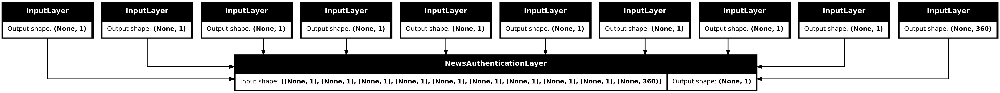

In [69]:
tf.keras.utils.plot_model(
    model,
    to_file="snippets/model_snippets/news_authentication_model_architecture.png",
    show_shapes=True,
    expand_nested=True
)

## Training

In [70]:
from tfx.components import Trainer

In [71]:
from tfx.components.base.executor_spec import ExecutorClassSpec
from tfx.components.trainer.executor import GenericExecutor
from tfx.proto import trainer_pb2

In [72]:
trainer=Trainer(
    module_file=os.path.abspath("modules/training_module.py"),
    custom_executor_spec=ExecutorClassSpec(GenericExecutor),
    transformed_examples=transform_gen.outputs["transformed_examples"],
    transform_graph=transform_gen.outputs["transform_graph"],
    schema=schema_updater.outputs["updated_schema"],
    train_args=trainer_pb2.TrainArgs(num_steps=500),
    eval_args=trainer_pb2.EvalArgs(num_steps=500)
)

In [74]:
context.run(trainer)

ExecutionResult(
    component_id: Trainer
    execution_id: 12
    outputs:
        model: OutputChannel(artifact_type=Model, producer_component_id=Trainer, output_key=model, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        model_run: OutputChannel(artifact_type=ModelRun, producer_component_id=Trainer, output_key=model_run, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

## Tensorboard Visulaizations

In [75]:
model_dir=trainer.outputs["model"].get()[0].uri

In [76]:
%load_ext tensorboard

In [77]:
%tensorboard --logdir {model_dir}

# Model Analysis And Validation

## Model Resolver

In [78]:
from tfx.dsl.components.common.resolver import Resolver
from tfx.dsl.experimental.latest_blessed_model_resolver import LatestBlessedModelResolver

In [79]:
from tfx.types import Channel
from tfx.types.standard_artifacts import Model,ModelBlessing

In [80]:
model_resolver=Resolver(
    strategy_class=LatestBlessedModelResolver,
    model=Channel(type=Model),
    model_blessing=Channel(type=ModelBlessing)
).with_id('latest_blessed_model_resolver')

In [81]:
context.run(model_resolver)

ExecutionResult(
    component_id: latest_blessed_model_resolver
    execution_id: 13
    outputs:
        model: OutputChannel(artifact_type=Model, producer_component_id=latest_blessed_model_resolver, output_key=model, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        model_blessing: OutputChannel(artifact_type=ModelBlessing, producer_component_id=latest_blessed_model_resolver, output_key=model_blessing, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

## Model Evaluation

In [82]:
import tensorflow_model_analysis as tfma

In [83]:
from tensorflow_model_analysis.proto import config_pb2

### Evaluation Config

In [84]:
eval_config = tfma.EvalConfig(
    model_specs=[
        tfma.ModelSpec(label_key="label")
    ],
    slicing_specs=[
        tfma.SlicingSpec()
    ],
    metrics_specs=[
        tfma.MetricsSpec(
            metrics=[
                tfma.MetricConfig(
                    class_name="BinaryAccuracy",
                    threshold=config_pb2.MetricThreshold(
                        value_threshold=config_pb2.GenericValueThreshold(
                            lower_bound={"value": 0.70}
                        ),
                        change_threshold=config_pb2.GenericChangeThreshold(
                            direction=config_pb2.MetricDirection.HIGHER_IS_BETTER,
                            absolute={"value": 0.02}
                        )
                    )
                ),

                tfma.MetricConfig(
                    class_name="Precision",
                    threshold=config_pb2.MetricThreshold(
                        value_threshold=config_pb2.GenericValueThreshold(
                            lower_bound={"value": 0.70}
                        ),
                        change_threshold=config_pb2.GenericChangeThreshold(
                            direction=config_pb2.MetricDirection.HIGHER_IS_BETTER,
                            absolute={"value": 0.01}
                        )
                    )
                ),

                tfma.MetricConfig(
                    class_name="Recall",
                    threshold=config_pb2.MetricThreshold(
                        value_threshold=config_pb2.GenericValueThreshold(
                            lower_bound={"value": 0.70}
                        ),
                        change_threshold=config_pb2.GenericChangeThreshold(
                            direction=config_pb2.MetricDirection.HIGHER_IS_BETTER,
                            absolute={"value": 0.01}
                        )
                    )
                ),

                tfma.MetricConfig(
                    class_name="AUC",
                    threshold=config_pb2.MetricThreshold(
                        value_threshold=config_pb2.GenericValueThreshold(
                            lower_bound={"value": 0.70}
                        ),
                        change_threshold=config_pb2.GenericChangeThreshold(
                            direction=config_pb2.MetricDirection.HIGHER_IS_BETTER,
                            absolute={"value": 0.01}
                        )
                    )
                ),
            ]
        )
    ]
)

In [85]:
from tfx.components import Evaluator

In [86]:
evaluator=Evaluator(
    examples=data_cleaner.outputs["preprocessed_examples"],
    model=trainer.outputs["model"],
    baseline_model=model_resolver.outputs["model"],
    eval_config=eval_config,
    example_splits=["test"]
)

In [89]:
context.run(evaluator)

ExecutionResult(
    component_id: Evaluator
    execution_id: 15
    outputs:
        evaluation: OutputChannel(artifact_type=ModelEvaluation, producer_component_id=Evaluator, output_key=evaluation, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False)
        blessing: OutputChannel(artifact_type=ModelBlessing, producer_component_id=Evaluator, output_key=blessing, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

In [90]:
eval_result_path=evaluator.outputs["evaluation"].get()[0].uri
eval_result = tfma.load_eval_result(eval_result_path)

eval_result.slicing_metrics[0][1][""][""]

{'binary_accuracy': {'doubleValue': 0.9892893004574361},
 'precision': {'doubleValue': 0.9848416289592761},
 'recall': {'doubleValue': 0.9933820173436787},
 'auc': {'doubleValue': 0.9987560988270265}}

# Human Evaluator [Custom Component]

## ComponentSpec

In [91]:
from tfx.types.component_spec import ComponentSpec
from tfx.types.component_spec import ChannelParameter
from tfx.types.component_spec import ExecutionParameter
from tfx.types.standard_artifacts import ModelEvaluation
from tfx.types.standard_artifacts import ModelBlessing

In [92]:
class HumanEvaluatorComponentSpec(ComponentSpec):
    """
    Component Spec for custom Human Evaluator Component
    """

    INPUTS={
        "model_evaluation":ChannelParameter(type=ModelEvaluation),
        "model_blessing":ChannelParameter(type=ModelBlessing)
    }

    OUTPUTS={
        "human_evaluator_blessing":ChannelParameter(type=ModelBlessing)
    }

    PARAMETERS={
        "human_evaluator_email_id":ExecutionParameter(type=str),
        "num_retries":ExecutionParameter(type=int),
        "waiting_time":ExecutionParameter(type=int)
    }

## Executor

In [93]:
from tfx.components.base.base_executor import BaseExecutor
from tfx.types.standard_artifacts import Artifact
from tfx.types import artifact_utils

In [94]:
import os
from dotenv import load_dotenv
load_dotenv()

True

In [95]:
import smtplib
from email.message import EmailMessage
from email.utils import formatdate
from email.utils import make_msgid

In [96]:
from datetime import datetime

In [97]:
import tensorflow_model_analysis as tfma

In [98]:
import imaplib
import email
from email_reply_parser import EmailReplyParser

In [99]:
from typing_extensions import Dict,List,Text,Any

In [100]:
import time

In [101]:
class HumanEvaluatorExecutor(BaseExecutor):
    """
    Executor for custom Human Evaluation (through email) Component.
    """

    def SendEmail(
        self,
        receiver_email_id:str,
        evaluation_file_path:str
    ):
        """
        Send email consisting of the details of the pipeline run to the Human Evaluator.
        """

        
        def generate_email_subject():
            """
            Generating email subject.
            """
            
            time=datetime.now()
            subject=f"[{time}] News Authentication Pipeline Evaluation"
        
            return subject

        
        def generate_email_content(evaluation_file_path:str):
            """
            Generating the content of the email
            """
            
            #Loading configs:
            config_folder="configs/model_configs/"
    
            model_details_path=os.path.join(config_folder,"model_details.json")
            text_model_config_path=os.path.join(config_folder,"text_model_config.json")
            example_split_path=os.path.join(config_folder,"number_of_examples.json")
            training_config_path=os.path.join(config_folder,"training_configs.json")
            training_details_path=os.path.join(config_folder,"training_details.json")
            optimizer_config_path=os.path.join(config_folder,"optimizer_config.json")
    
    
            with open(model_details_path,"r") as file:
                model_details=json.load(file)
    
            with open(text_model_config_path,"r") as file:
                text_model_config=json.load(file)
    
            with open(example_split_path,"r") as file:
                example_split=json.load(file)
    
            with open(training_config_path,"r") as file:
                training_config=json.load(file)
    
            with open(training_details_path,"r") as file:
                training_details=json.load(file)
    
            with open(optimizer_config_path,"r") as file:
                optimizer_config=json.load(file)
    
            
            eval_result=tfma.load_eval_result(evaluation_file_path).slicing_metrics[0][1][""][""]
            test_binary_acc=round(eval_result["binary_accuracy"]["doubleValue"],2)
            test_precision=round(eval_result["precision"]["doubleValue"],2)
            test_recall=round(eval_result["recall"]["doubleValue"],2)
            test_auc=round(eval_result["auc"]["doubleValue"],2)
            
    
            content=f"""
            Hi Developer,
    
            The news authentication model has completed the training successfully.
            Given follow are some details about the pipeline run:
    
            Overview of the News Authentication Model:
             - Number of Parameters: {model_details['num_of_parameters']}
             - Model Size : {model_details['model_size']}
             
    
            Overview of the Text Processing Model:
             - Num of parallel text processing model: {text_model_config['num_models']}
             - Vocab Size: {text_model_config['vocab_size']}
             - Embedding Dimension: {text_model_config['embedding_dim']}
             - Text Sequence Length: {text_model_config['text_seq_len']}
    
    
            Number of examples in each Split:
             - Number of Training data examples: {example_split['number_of_examples_in_Split-train_data']}
             - Number of Validation data examples: {example_split['number_of_examples_in_Split-eval_data']}
             - Number of Testing data examples: {example_split['number_of_examples_in_Split-test_data']}
    
             
            Training Hyperparameters of News Authentication Model:
             - Batch Size: {training_config['BATCH_SIZE']}
             - Number of Training Steps: {training_config['NUM_TRAIN_STEPS']}
             - Number of Validation Steps: {training_config['NUM_EVAL_STEPS']}
             - Optimizer: Adam
             - Learning Rate: {optimizer_config['learning_rate']}
             - Loss Function: Categorical Cross Entropy
    
    
            Training Performance:
             - Average Training Loss: {training_details['avg_training_loss']}
             - Average Training Accuracy: {training_details['avg_training_accuracy']}
    
             
            Validation Performance:
             - Average Validation Loss: {training_details['avg_validation_loss']}
             - Average Validation Accuracy: {training_details['avg_validation_accuracy']}
    
    
            Testing Performance:
             - Binary Accuracy: {test_binary_acc}
             - Precision: {test_precision}
             - Recall: {test_recall}
             - AUC: {test_auc}
    
    
            For more details, visit the following jupyter notebook:
            'https://github.com/spiralMonster/news-authenticity-pipeline/blob/main/pipeline_components_notebook.ipynb'
    
            Reply with 'Approve' to continue the pipeline run.
            Reply with 'Disapprove' to stop the pipeline run.
    
            Regards,
            Human Evaluator Component
            """
    
            return content


        def send(
            receiver_email_id:str,
            email_subject:str,
            email_content:str
            
            
        ):
            """
            send the email.
            """
        
            EMAIL_ADDRESS=os.environ["EMAIL_ADDRESS"]
            APP_PASSWORD=os.environ["APP_PASSWORD"]
    
            email_id=make_msgid()
    
            msg=EmailMessage()
            msg["Subject"]=email_subject
            msg["From"]=EMAIL_ADDRESS
            msg["To"]=receiver_email_id
            msg["Date"]=formatdate(localtime=True)
            msg["Message-ID"]=email_id
            msg["Reply-To"]=EMAIL_ADDRESS
    
            msg.set_content(email_content)
    
            try:
                with smtplib.SMTP_SSL("smtp.gmail.com",465) as smtp_cli:
                    smtp_cli.login(EMAIL_ADDRESS,APP_PASSWORD)
                    smtp_cli.send_message(msg)

                email_id=email_id.strip()
                return email_id

            except Exception as e:
                print(f"Exception encountered: {e}")
                return None


        print(f"[INFO] Generating email subject.")
        email_subject=generate_email_subject()

        print(f"[INFO] Generating email content.")
        email_content=generate_email_content(evaluation_file_path=evaluation_file_path)

        email_id=send(
            receiver_email_id=receiver_email_id,
            email_subject=email_subject,
            email_content=email_content
        )
        

        if email_id is None:
            return (email_id,None)

        else:
            return (email_id,email_subject)
    


    def ReadEmailReply(
        self,
        sent_email_id,
        email_subject
    ):
        """
        Read the Reply of the Human Evaluator
        """

        def get_email_body(msg):
            """
            Get the body of the email.
            """

            if msg.is_multipart():
                for part in msg.walk():
                    if part.get_content_type()=="text/plain":
                        payload=part.get_payload(decode=True)
                        if payload:
                            body=payload.decode(errors="ignore")
                            return body
                            
            else:
                payload=msg.get_payload(decode=True)
                if payload:
                    body=payload.decode(errors="ignore")
                    return body
                    

            return None
                

            

        EMAIL_ADDRESS=os.environ["EMAIL_ADDRESS"]
        APP_PASSWORD=os.environ["APP_PASSWORD"]
        
        with imaplib.IMAP4_SSL("imap.gmail.com") as imap_cli:
            imap_cli.login(EMAIL_ADDRESS,APP_PASSWORD)
            imap_cli.select("INBOX")

            status,messages=imap_cli.search(
                None,
                f'(SUBJECT "{email_subject}")'
            )
            email_ids=messages[0].split()

            if len(email_ids)==0:
                return None

            else:
                email_id=email_ids[-1]

                status,msg_data=imap_cli.fetch(email_id,"(RFC822)")
                msg=email.message_from_bytes(msg_data[0][1])

                in_reply_to=msg.get("In-Reply-To").strip()
                if (in_reply_to is not None and sent_email_id==in_reply_to):

                    body=get_email_body(msg)
                    if body is None:
                        print(f"[Warning] Could not extract email body.")
                        return None

                    reply=EmailReplyParser.parse_reply(body).strip()
                    return reply
                    

                else:
                    return None

   

    def Do(
        self,
        input_dict: Dict[Text,List[Artifact]],
        output_dict: Dict[Text,List[Artifact]],
        exec_properties: Dict[Text,Any]
    ):
        print(f"[START] Human Evaluator Component.")
        self._log_startup(input_dict,output_dict,exec_properties)

        output_blessing=artifact_utils.get_single_instance(
            output_dict["human_evaluator_blessing"]
        )
        input_blessing=artifact_utils.get_single_instance(
            input_dict["model_blessing"]
        )
        
        is_blessed=None

        output_dir=output_dict["human_evaluator_blessing"][-1].uri
        tf.io.gfile.makedirs(output_dir)
        
        evaluator_blessing_dir=input_dict["model_blessing"][-1].uri
        evaluator_blessing=os.listdir(evaluator_blessing_dir)[-1]

        if evaluator_blessing=="NOT_BLESSED":
            blessing="NOT_BLESSED"
            is_blessed=False
            
            output=os.path.join(output_dir,blessing)
            
            with tf.io.gfile.GFile(output,"w") as file:
                file.write("")
                

            
        else:
            evaluation_file_path=input_dict["model_evaluation"][-1].uri
    
            receiver_email_id=exec_properties["human_evaluator_email_id"]
            num_retries=exec_properties["num_retries"]
            waiting_time=exec_properties["waiting_time"]
    
            email_sent=False
    
            print(f"[INFO] Sending Email")
            for ind in range(num_retries):
                sent_email_id,sent_email_subject=self.SendEmail(
                    receiver_email_id=receiver_email_id,
                    evaluation_file_path=evaluation_file_path 
                )
    
                if sent_email_id is None:
                    print(f"[WARNING] Failed to send email.")
                    print(f"[INFO] Retrying sending email.")
    
    
                else:
                    print(f"[INFO] Email send successfully.")
                    email_sent=True
                    break
    
    
            if not email_sent:
                blessing="NOT_BLESSED"
                is_blessed=False
                
                output=os.path.join(output_dir,blessing)
                
                with tf.io.gfile.GFile(output,"w") as file:
                    file.write("")
                     
    
    
            else:
                reply_received=False
                
                print(f"[INFO] Reading Human Evaluator Response...")
                for _ in range(num_retries):
                    time.sleep(waiting_time)
    
                    reply=self.ReadEmailReply(
                        sent_email_id=sent_email_id,
                        email_subject=sent_email_subject
                    )
    
                    if reply is None:
                        print(f"[WARNING] No reply received yet.")
                        print(f"[INFO] Retrying after some time.")
    
                    else:
                        print(f"[INFO] The Reply Recieved.")
                        print(f"[INFO] Reply: {reply}")
    
                        reply_received=True
                        break
    
    
                if not reply_received:
                    blessing="NOT_BLESSED"
                    is_blessed=False
                    
                    output=os.path.join(output_dir,blessing)
                    
                    with tf.io.gfile.GFile(output,"w") as file:
                         file.write("")
                        
    
                else:
                    if reply=="Approve":
                        blessing="BLESSED"
                        is_blessed=True
    
                    else:
                        blessing="NOT_BLESSED"
                        is_blessed=False
                        
    
                    output=os.path.join(output_dir,blessing)
                    
                    with tf.io.gfile.GFile(output,"w") as file:
                        file.write("")
                        
                        
        output_blessing.set_int_custom_property(
            "current_model_id",
            input_blessing.get_int_custom_property("current_model_id")
        )
        
        output_blessing.set_string_custom_property(
            "current_model",
            input_blessing.get_string_custom_property("current_model")
        )

        output_blessing.set_int_custom_property(
            "blessed",
            1 if is_blessed else 0
        )
    

    
        

## Custom Component

In [102]:
from tfx.components.base.base_component import BaseComponent
from tfx.components.base.executor_spec import ExecutorClassSpec
from tfx.types import channel_utils
from tfx.types.standard_artifacts import ModelBlessing

In [103]:
class HumanEvaluator(BaseComponent):
    """
    The Custom Component of Human Evaluation by sending the details of the pipeline run to the Human Evaluator.
    """

    SPEC_CLASS = HumanEvaluatorComponentSpec
    EXECUTOR_SPEC = ExecutorClassSpec(HumanEvaluatorExecutor)

    def __init__(
            self,
            model_evaluation,
            model_blessing,
            human_evaluator_email_id,
            num_retries,
            waiting_time,
            human_evaluator_blessing=None

    ):
        """
        Args:       
        :param model_evaluation: The evaluation done by Evaluator Component.
        :param model_blessing: The blessing provided by Evaluator Component.
        :param human_evaluator_email_id: The email id of human evaluator.
        :param num_retries: Number of retries if there is some issue with email sending/receiving.
        :param waiting_time: Wait time (in seconds) before the reply of human evaluator is read.
        :param human_evaluator_blessing: The blessing of human evaluator
        """

        if not human_evaluator_blessing:
            artifact=ModelBlessing()

            human_evaluator_blessing=channel_utils.as_channel([artifact])

        
        spec=HumanEvaluatorComponentSpec(
            model_evaluation=model_evaluation,
            model_blessing=model_blessing,
            human_evaluator_email_id= human_evaluator_email_id,
            num_retries=num_retries,
            waiting_time=waiting_time,
            human_evaluator_blessing=human_evaluator_blessing
        )

        super(HumanEvaluator,self).__init__(spec=spec)
            

## Using Custom Component

In [104]:
human_evaluator=HumanEvaluator(
    model_evaluation=evaluator.outputs["evaluation"],
    model_blessing=evaluator.outputs["blessing"],
    human_evaluator_email_id="lightningsword104@gmail.com",
    num_retries=3,
    waiting_time=60

)

In [105]:
context.run(human_evaluator)

[START] Human Evaluator Component.
[INFO] Sending Email
[INFO] Generating email subject.
[INFO] Generating email content.
[INFO] Email send successfully.
[INFO] Reading Human Evaluator Response...
[INFO] The Reply Recieved.
[INFO] Reply: Approve


ExecutionResult(
    component_id: HumanEvaluator
    execution_id: 16
    outputs:
        human_evaluator_blessing: OutputChannel(artifact_type=ModelBlessing, producer_component_id=HumanEvaluator, output_key=human_evaluator_blessing, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))

# Model Pusher

In [107]:
from tfx.components import Pusher
from tfx.proto import pusher_pb2

In [108]:
_serving_model_dir="serving_model_dir"

In [109]:
pusher=Pusher(
    model=trainer.outputs["model"],
    model_blessing=human_evaluator.outputs["human_evaluator_blessing"],
    push_destination=pusher_pb2.PushDestination(
        filesystem=pusher_pb2.PushDestination.Filesystem(
            base_directory=_serving_model_dir
        )
    )
)

In [110]:
context.run(pusher)

ExecutionResult(
    component_id: Pusher
    execution_id: 17
    outputs:
        pushed_model: OutputChannel(artifact_type=PushedModel, producer_component_id=Pusher, output_key=pushed_model, additional_properties={}, additional_custom_properties={}, _input_trigger=None, _is_async=False))